# Machine Learning and Computational Statistics
## Project Machine Learning F2023-2024

Student: Rafail Mpalis

Registration Number: f3352308

## Loading Data

We will define some functions in order to load, plot and check our data.

In [2]:
import time
import scipy.io as sio
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import minimize, nnls

def load_data(file, column_name):
    """
    Load matlab data
    """
    my_file = sio.loadmat(file)
    data = my_file[column_name]
    return data

def plot_data(dataset, ylabel, xlabel, title):
    """
    Plot lines of a dataset
    """
    plt.figure(figsize=(10, 6))
    plt.plot(dataset)
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)
    plt.title(title)
    plt.show()

def image_show(image, band):
    """
    Add an image with the desired spectral band and show it 
    """
    plt.figure(figsize=(10, 6))
    plt.imshow(image[:,:,band])
    plt.title(f'RGB Visualization of the {band}th band of Pavia University HSI')
    plt.show()

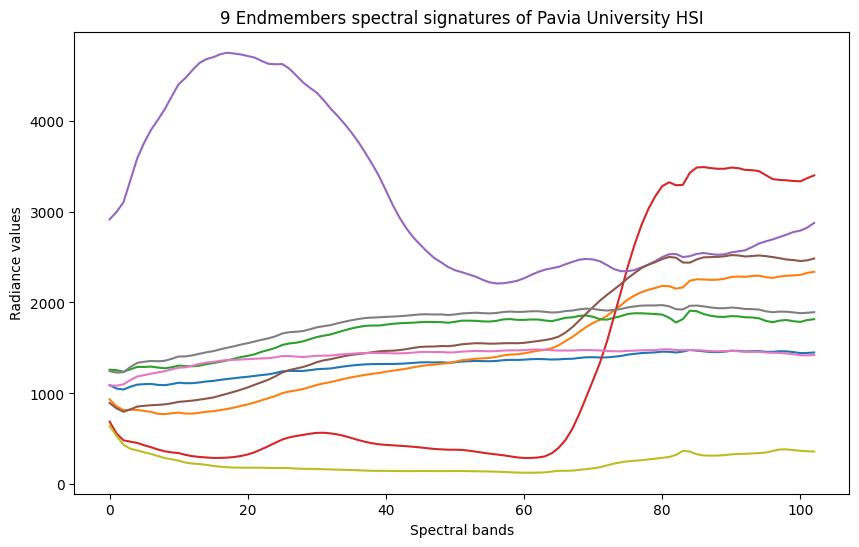

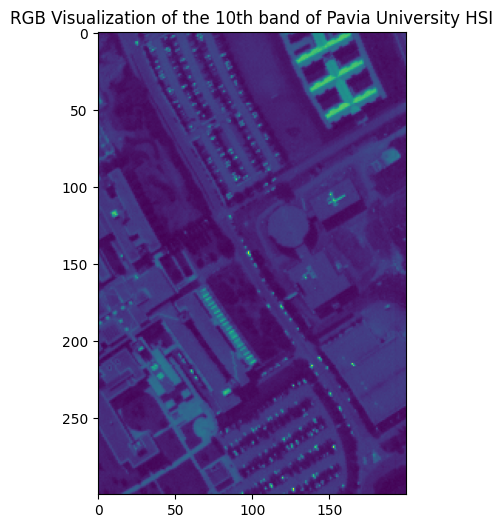

In [3]:
image_file = 'data/PaviaU_cube.mat'  # Pavia HSI: 300x200x103
endmembers_file = 'data/PaviaU_endmembers.mat'  # Endmember's matrix: 103x9
ground_truth_file = 'data/PaviaU_ground_truth.mat' 

HSI = load_data(image_file, 'X')
endmembers = load_data(endmembers_file, 'endmembers')


ylabel = 'Radiance values'
xlabel = 'Spectral bands'
title = '9 Endmembers spectral signatures of Pavia University HSI'
plot_data(endmembers, ylabel, xlabel, title)
image_show(HSI, 10)

## Part 1 Spectral Unmixing

At first, we will use Least Squares method in order to unmix the 9 endmembers of each pixel at the non-zero class labels.
We will first create a list with the non-zero class label pixels via the file 'PaviaU_ground_truth'.
We will create a function for calculating the parameters theta, using Least Squares and also a function in order to calculate the reconstruction error (||𝒚𝑖−𝑋𝜽𝑖||). I did not use the square in order not to compute a very large value. 
Finally, we will create a function in order to calculate and store the abundance map for each class (1 to 9).


In [8]:
def calc_theta_LS(X, y):
    """
    Calculation of theta via Least Squares method.
        No constraints inserted
        """
    XtX = np.dot(np.transpose(X), X)
    XtX_inverse = np.linalg.inv(XtX)
    XtY = np.dot(np.transpose(X), y)
    my_theta = np.dot(XtX_inverse, XtY)

    return my_theta

def calc_MSE(thetas, X, y):
    """
    Calculation of the reconstruction error
    using the equation ||𝒚𝑖−𝑋𝜽𝑖||
    """
    MSE = 0
    for i in range(len(thetas)):
        mse = (y[i] - np.dot(X, thetas[i]))
        MSE += np.linalg.norm(mse)

    MSE = MSE/len(thetas)
    return MSE


def calc_abundance_map(thetas, endmembers, HSI, groundtruth, num_of_class=0):
    """
    Creating the new map in which the non-zero class pixels have been
    calculated via parameter theta
    """
    step = 0
    for i in range(len(HSI)):
        for j in range(len(HSI[i])):
            if groundtruth[i][j] != 0:
                HSI[i][j] = thetas[step][num_of_class] * endmembers[:, num_of_class]
                step += 1

    return HSI

# Load the ground truth file
ground_truth = load_data(ground_truth_file, 'y')
sum_zero = 0
non_zero_pixels = []
# Keep and store only the pixels with non zero class label
for i in range(len(ground_truth)):
    for j in range(len(ground_truth[i])):
        if ground_truth[i][j] == 0:
            sum_zero += 1
        else:
            non_zero_pixels.append(HSI[i][j])

non_zero_pixels = np.array(non_zero_pixels)


### a) Using Least squares with no constraints


MSE for the Least Squares method is: 335.5921598100192
Plotting the abundance map for class/endmember: 1


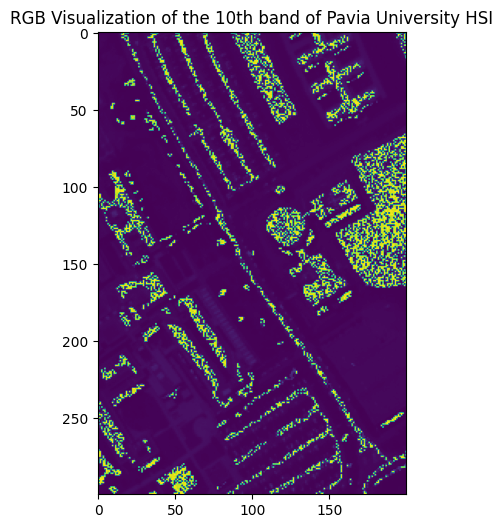

Plotting the abundance map for class/endmember: 2


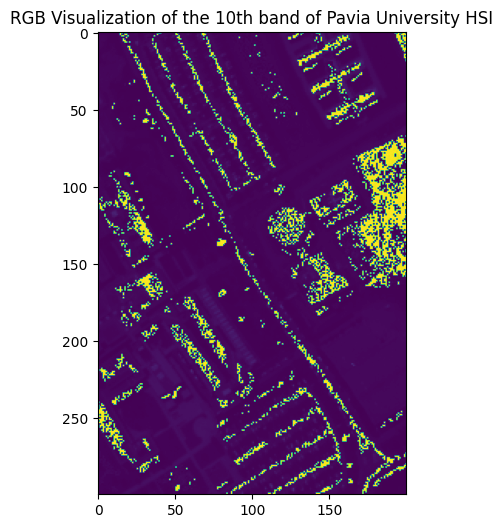

Plotting the abundance map for class/endmember: 3


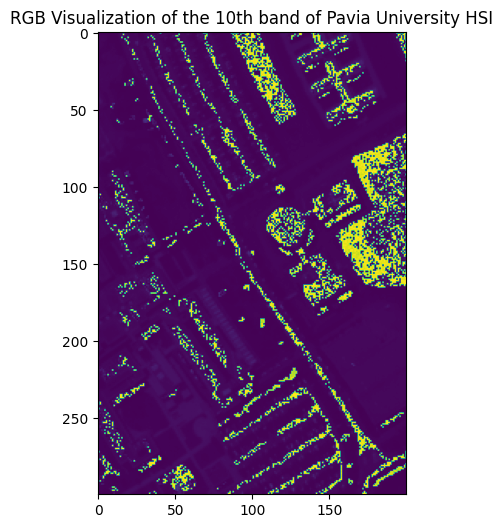

Plotting the abundance map for class/endmember: 4


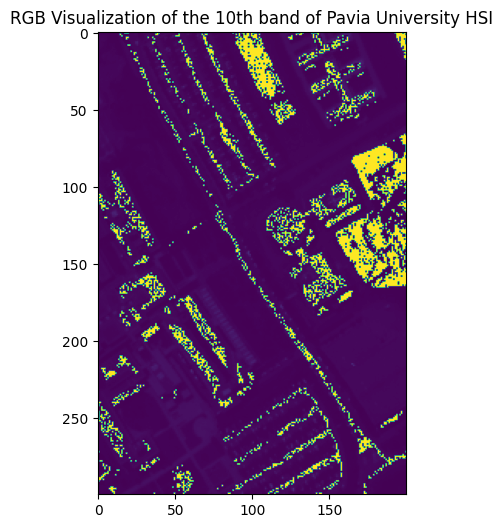

Plotting the abundance map for class/endmember: 5


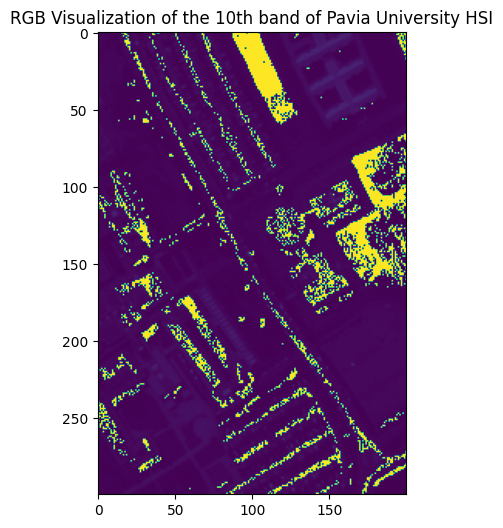

Plotting the abundance map for class/endmember: 6


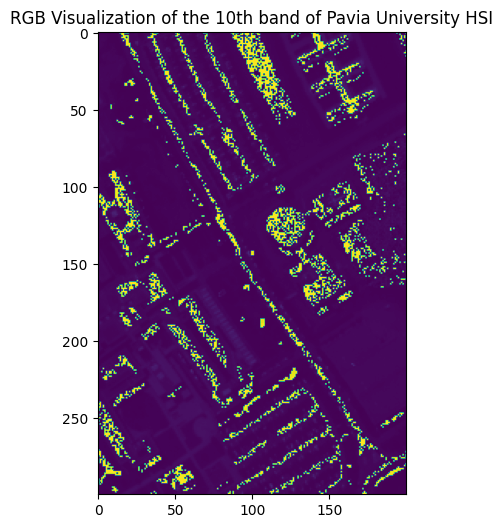

Plotting the abundance map for class/endmember: 7


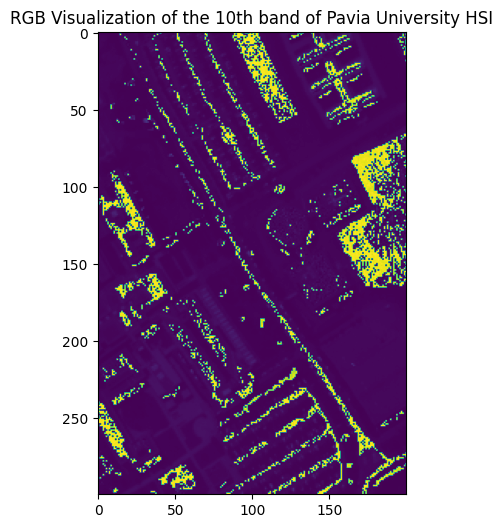

Plotting the abundance map for class/endmember: 8


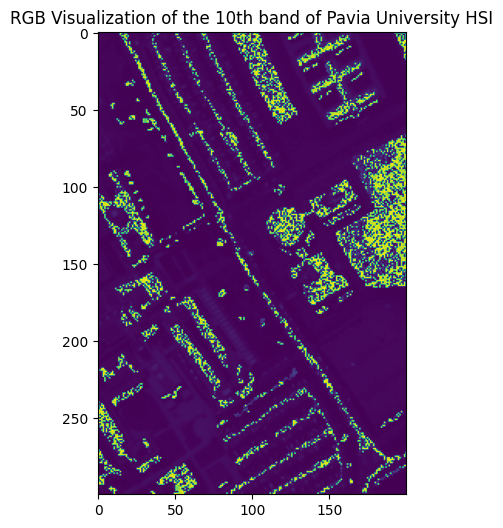

Plotting the abundance map for class/endmember: 9


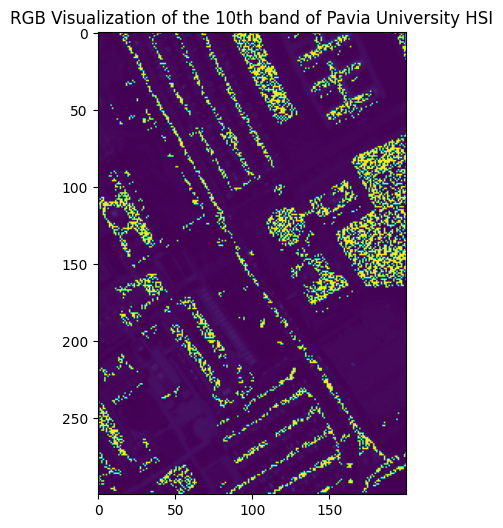

In [9]:
# Compute the thetas based on Least Squares, calculate the reconstruction error (||𝒚𝑖−𝑋𝜽𝑖||) and plot the 9 abundance maps
LS_thetas = []
for pixel in non_zero_pixels:
    LS_thetas.append(calc_theta_LS(endmembers, pixel))

MSE_LS = calc_MSE(LS_thetas, endmembers, non_zero_pixels)
print(f"MSE for the Least Squares method is: {MSE_LS}")

for i in range(9):
    HSI_LS = calc_abundance_map(LS_thetas, endmembers, HSI, ground_truth, num_of_class=i)
    print(f'Plotting the abundance map for class/endmember: {i+1}')
    image_show(HSI_LS, 10)

### b) Least squares imposing the sum-to-one constraint
So, we will use Least Squares however the parameters must sum-to-one.


MSE for the Least Squares method with constraint sum-to-one is: 385.59855862255944
Plotting the abundance map for class/endmember: 1


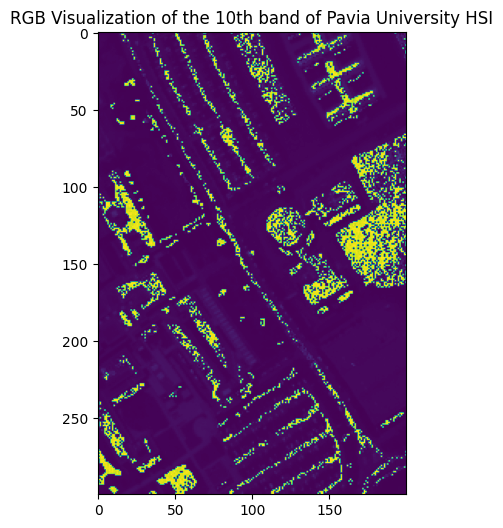

Plotting the abundance map for class/endmember: 2


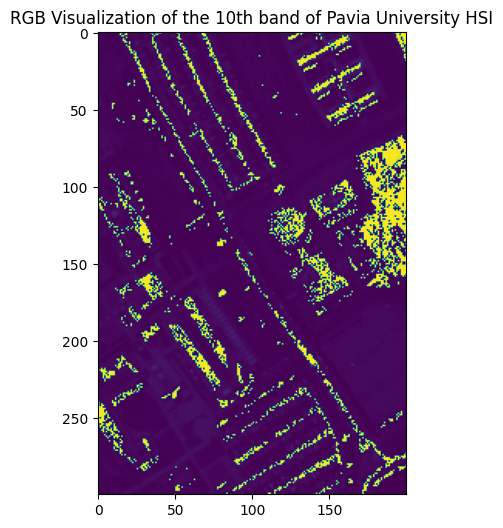

Plotting the abundance map for class/endmember: 3


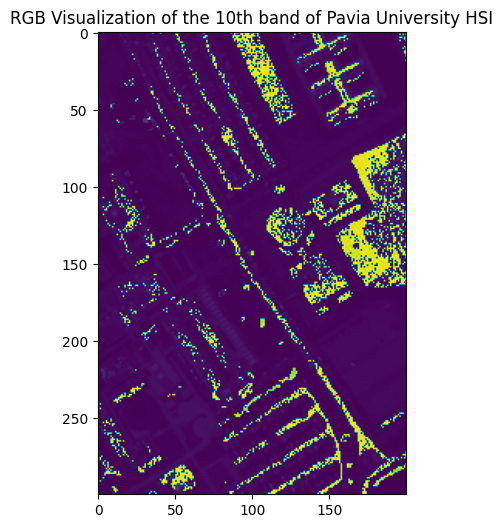

Plotting the abundance map for class/endmember: 4


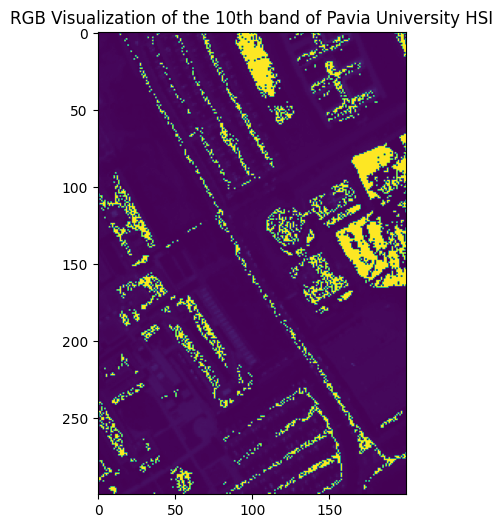

Plotting the abundance map for class/endmember: 5


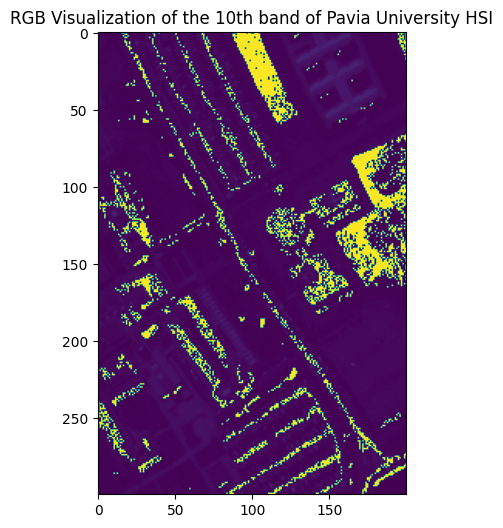

Plotting the abundance map for class/endmember: 6


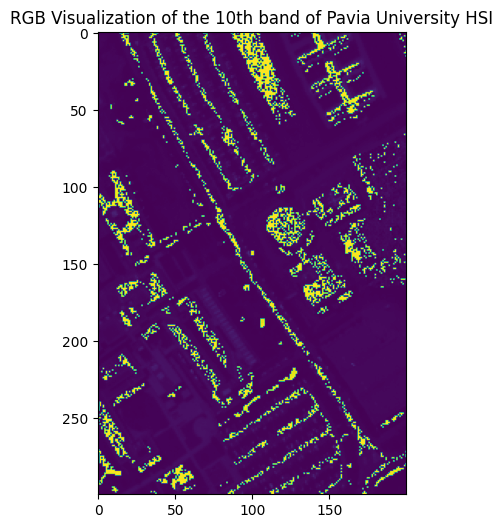

Plotting the abundance map for class/endmember: 7


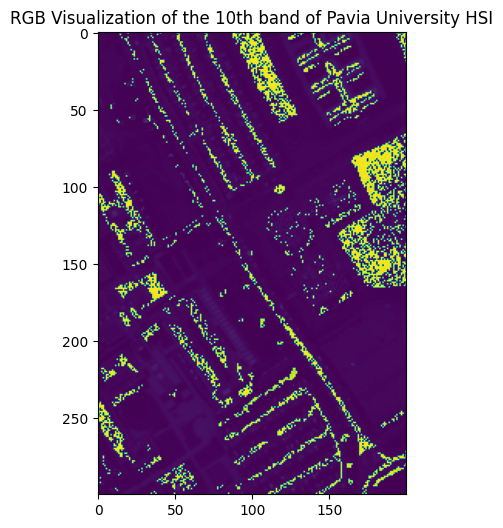

Plotting the abundance map for class/endmember: 8


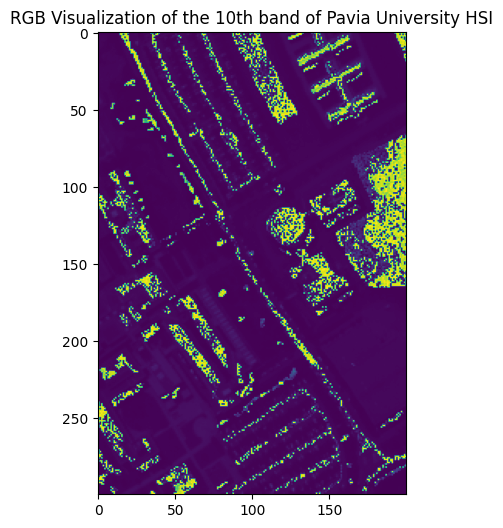

Plotting the abundance map for class/endmember: 9


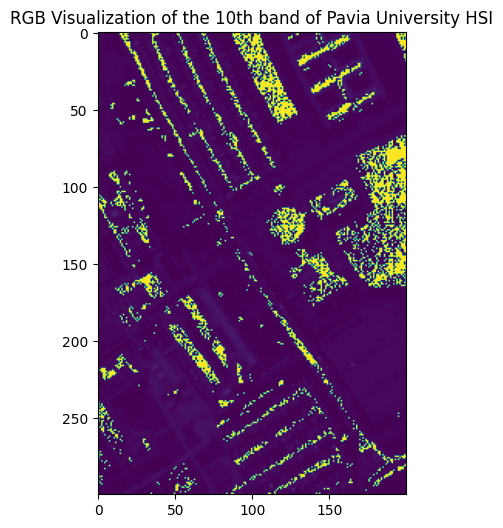

In [12]:
def objective_normalize_theta(theta, X, y):
    """
    Normalize the coefficients to ensure sum-to-one constraint
    """
    theta_normalized = theta / np.sum(theta)
    return np.sum((X @ theta_normalized - y) ** 2)
    

def calc_theta_LS_constraints(X, y, bounds=False):
    """
    Calc theta with constraints
    """
    num_of_theta = np.ones(9) / 9
    if bounds:
        bounds = [(0, None)] * 9
        result = minimize(objective_normalize_theta, num_of_theta, args=(X, y), bounds=bounds)
    else:
        result = minimize(objective_normalize_theta, num_of_theta, args=(X, y))

    my_theta = result.x / np.sum(result.x)
    return my_theta

LS_thetas_sum_to_one = []
for pixel in non_zero_pixels:
    LS_thetas_sum_to_one.append(calc_theta_LS_constraints(endmembers, pixel))
MSE_sum_to_one = calc_MSE(LS_thetas_sum_to_one, endmembers, non_zero_pixels)
print(f"MSE for the Least Squares method with constraint sum-to-one is: {MSE_sum_to_one}")

for i in range(9):
    HSI_LS_sum_to_one = calc_abundance_map(LS_thetas_sum_to_one, endmembers, HSI, ground_truth, num_of_class=i)
    print(f'Plotting the abundance map for class/endmember: {i+1}')
    image_show(HSI_LS_sum_to_one, 10)

### c) Least squares imposing the non-negativity constraint
So, we will use Least Squares however the parameters must be non-negative.

MSE for the Least Squares method with constraint non-negativity is: 452.79891706920523
Plotting the abundance map for class/endmember: 1


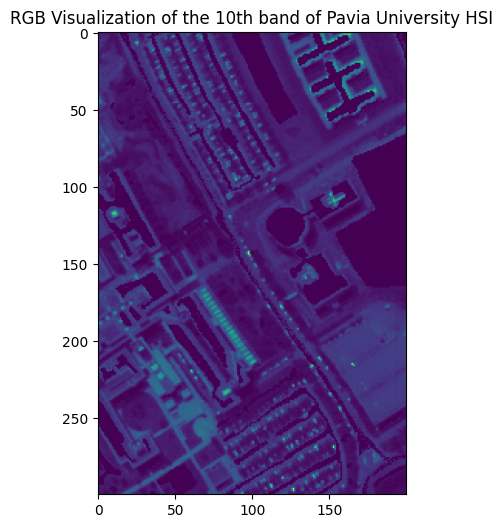

Plotting the abundance map for class/endmember: 2


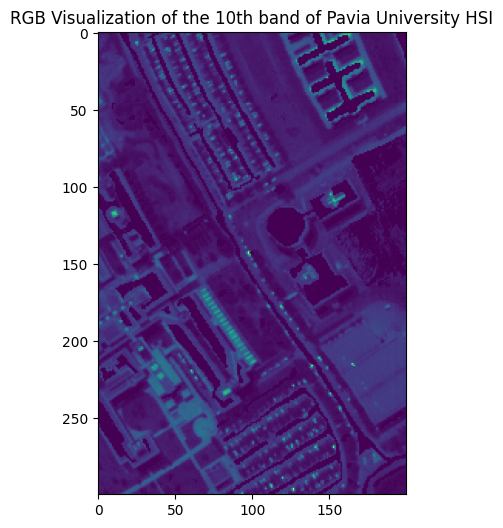

Plotting the abundance map for class/endmember: 3


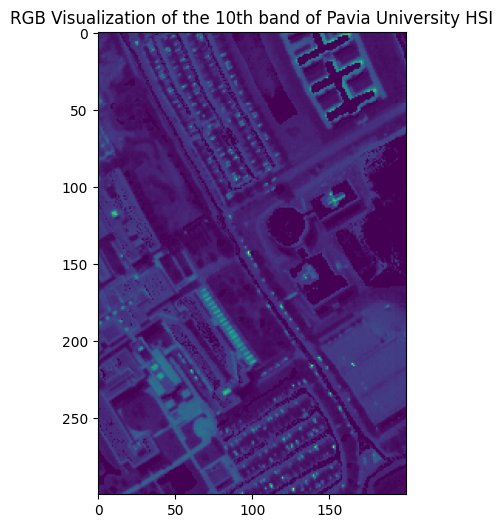

Plotting the abundance map for class/endmember: 4


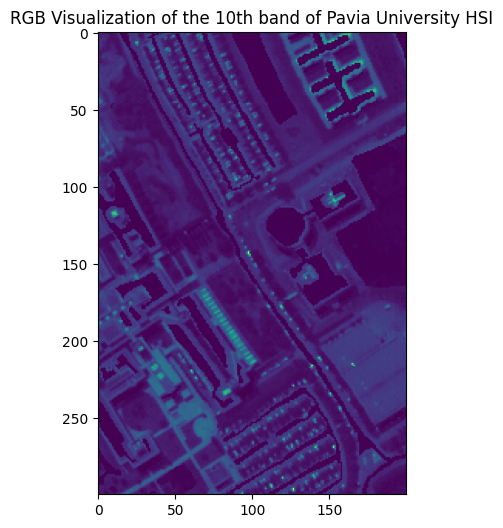

Plotting the abundance map for class/endmember: 5


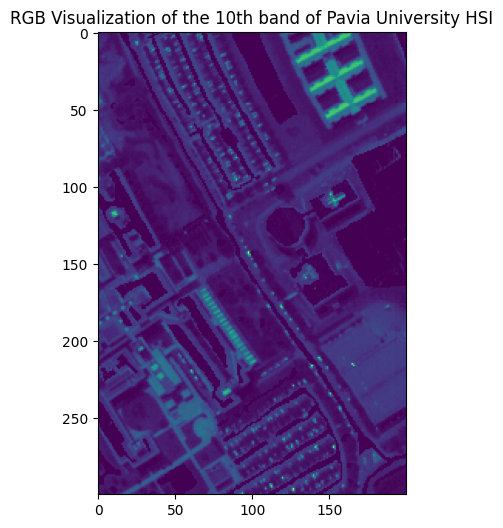

Plotting the abundance map for class/endmember: 6


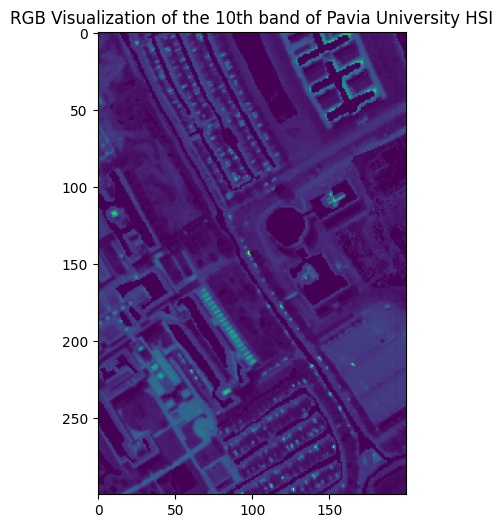

Plotting the abundance map for class/endmember: 7


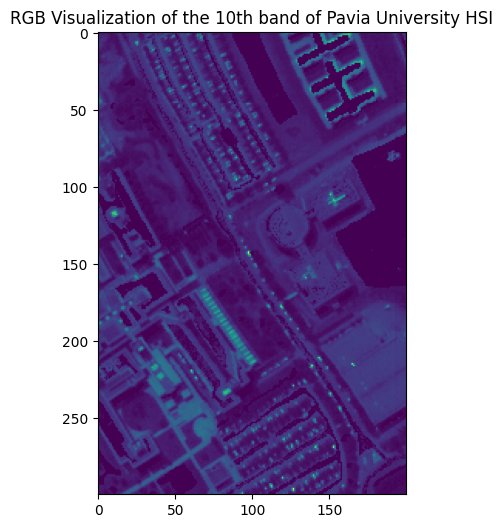

Plotting the abundance map for class/endmember: 8


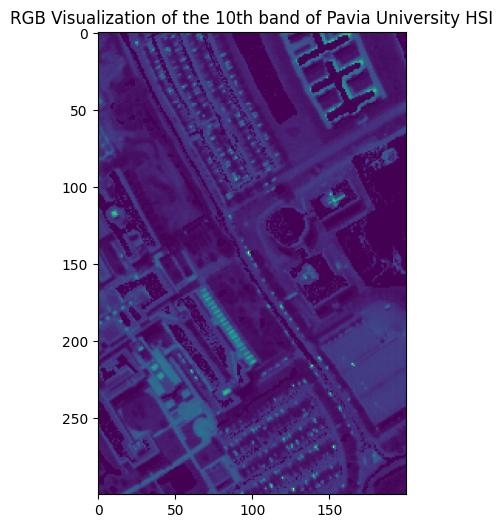

Plotting the abundance map for class/endmember: 9


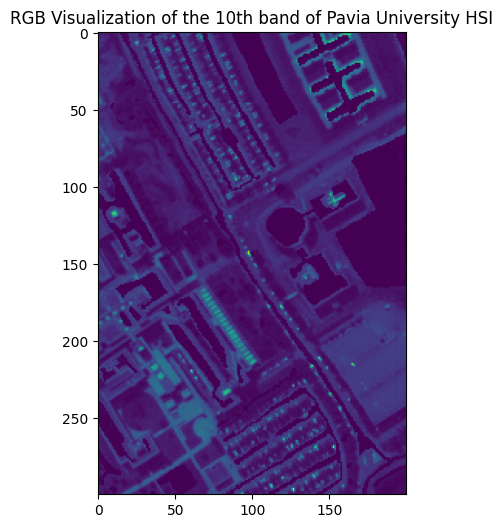

In [13]:
from scipy.optimize import nnls

LS_thetas_non_negative = []
for pixel in non_zero_pixels:
    optimal, MSE_non_negative = nnls(endmembers, pixel)
    LS_thetas_non_negative.append(optimal)

print(f"MSE for the Least Squares method with constraint non-negativity is: {MSE_non_negative}")

for i in range(9):
    HSI_LS_non_negative = calc_abundance_map(LS_thetas_non_negative, endmembers, HSI, ground_truth, num_of_class=i)
    print(f'Plotting the abundance map for class/endmember: {i+1}')
    image_show(HSI_LS_non_negative, 10)

### d) Least squares imposing the non-negativity AND sum-to-one constraints
So, we will use Least Squares, however the parameters must be non-negative and sum-to-one.

C:\Users\joker\AppData\Local\Temp\ipykernel_18704\3001419531.py:5: RuntimeWarning: divide by zero encountered in divide
  theta_normalized = theta / np.sum(theta)
C:\Users\joker\AppData\Local\Temp\ipykernel_18704\3001419531.py:5: RuntimeWarning: invalid value encountered in divide
  theta_normalized = theta / np.sum(theta)


MSE for the Least Squares method with constraints non-negativity and sum-to-one is: 1231.949520474831
Plotting the abundance map for class/endmember: 1


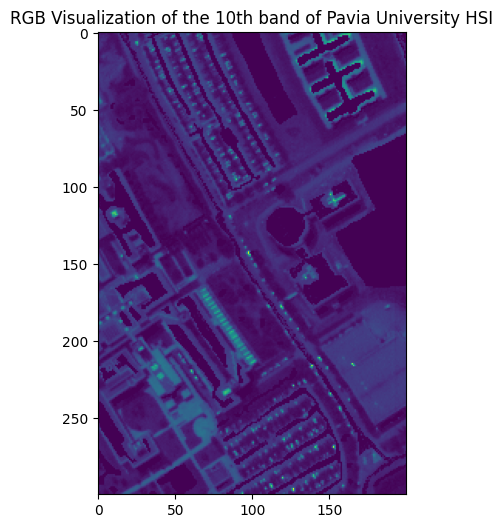

Plotting the abundance map for class/endmember: 2


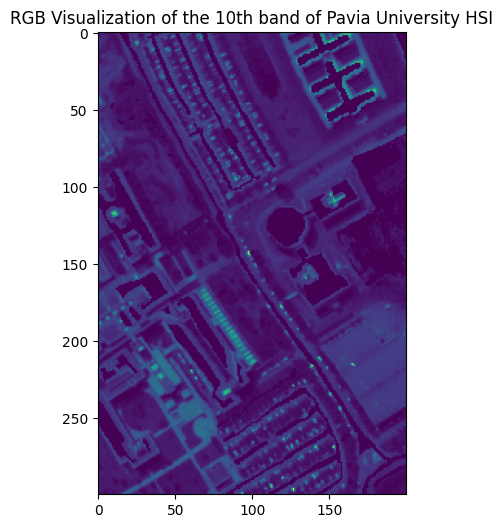

Plotting the abundance map for class/endmember: 3


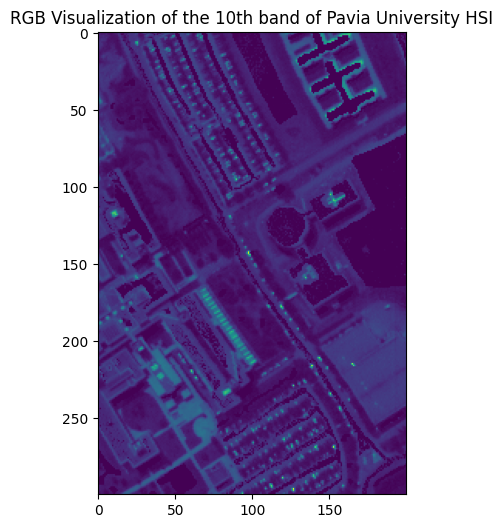

Plotting the abundance map for class/endmember: 4


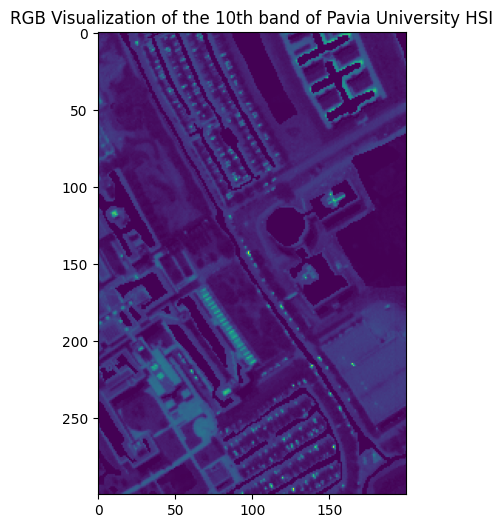

Plotting the abundance map for class/endmember: 5


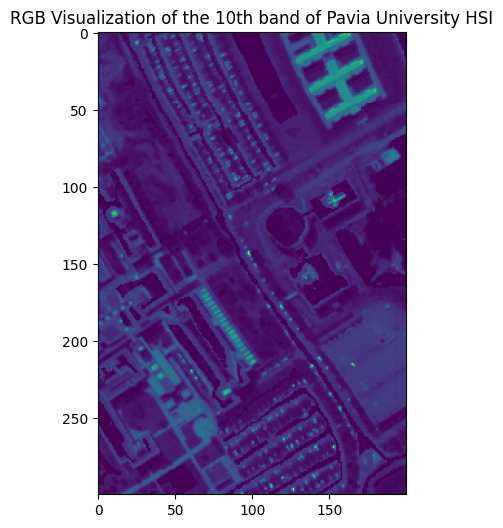

Plotting the abundance map for class/endmember: 6


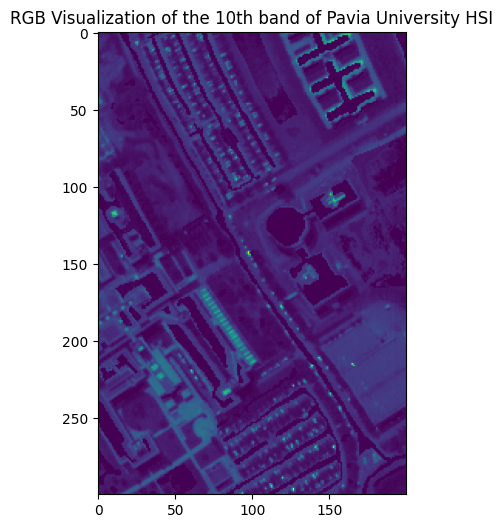

Plotting the abundance map for class/endmember: 7


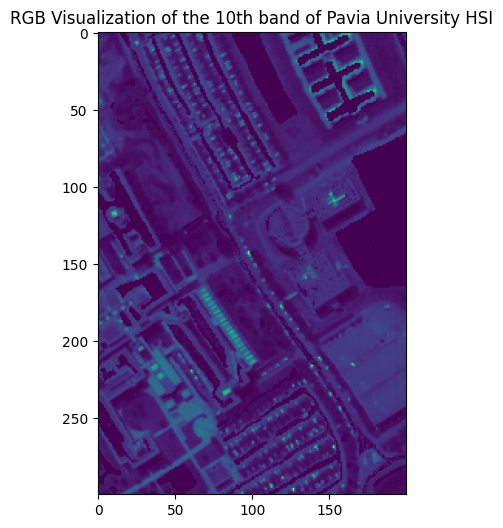

Plotting the abundance map for class/endmember: 8


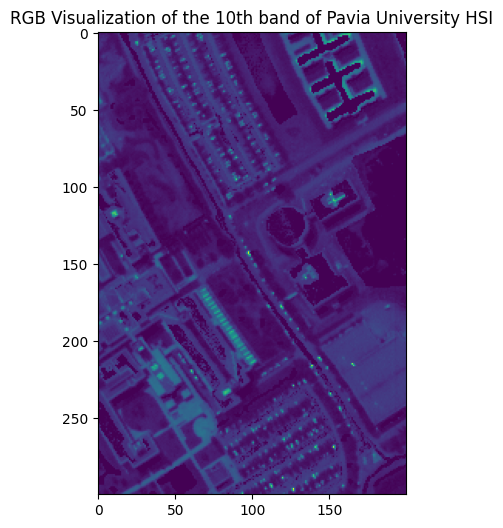

Plotting the abundance map for class/endmember: 9


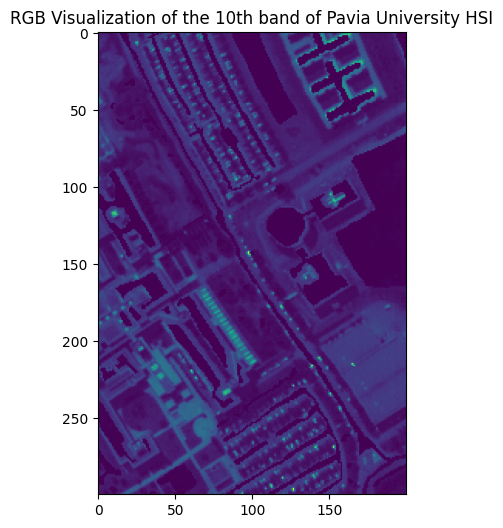

In [14]:
LS_thetas_constraints = []
for pixel in non_zero_pixels:
    LS_thetas_constraints.append(calc_theta_LS_constraints(endmembers, pixel, bounds=True))
    
MSE_constraints = calc_MSE(LS_thetas_constraints, endmembers, non_zero_pixels)
print(f"MSE for the Least Squares method with constraints non-negativity and sum-to-one is: {MSE_constraints}")

for i in range(9):
    HSI_LS_constraints = calc_abundance_map(LS_thetas_constraints, endmembers, HSI, ground_truth, num_of_class=i)
    print(f'Plotting the abundance map for class/endmember: {i+1}')
    image_show(HSI_LS_constraints, 10)

### e) LASSO, where impose sparsity on θ via 𝑙1 norm minimization.

So, we will use various values of hyperparameter λ in order to find the best combination.
We started by λ=0.1 and we reached until 900. We spotted that around value λ=870 the reconstraint error started increase, 
thus we stopped at value λ=900 and searched around value = 850 in order to find the optimum one.

In [10]:
from sklearn.linear_model import Lasso
from sklearn.exceptions import ConvergenceWarning
import warnings

with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=ConvergenceWarning)
    l = 850
    comp_MSE_lasso = -1
# Played with various values of λ, so ended up around λ=850.    
    while l <= 870:
        l += 1
        thetas_lasso = []
        lasso_model = Lasso(alpha=l)
        for pixel in non_zero_pixels:
            lasso_model.fit(endmembers, pixel)
            thetas_lasso.append(lasso_model.coef_)
        MSE_lasso = calc_MSE(thetas_lasso, endmembers, non_zero_pixels)
        if comp_MSE_lasso == -1:
            comp_MSE_lasso = MSE_lasso
        if MSE_lasso < comp_MSE_lasso:
            best_MSE_lasso = {}
            best_MSE_lasso[l] = MSE_lasso
            best_theta_lasso = thetas_lasso
            
for key, value in best_MSE_lasso.items():
    print(f"Best hyperparameter λ for the Lasso method is: {key:.2f} with reconstruction error: {value:.3f}")


Best hyperparameter λ for the Lasso method is: 865.00 with reconstruction error: 4659.383


Plotting the abundance map for class/endmember: 1


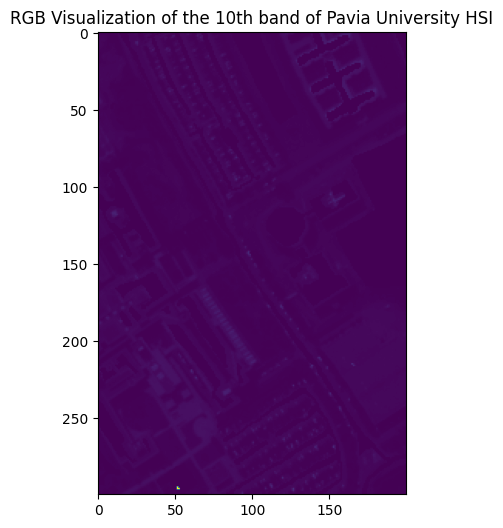

Plotting the abundance map for class/endmember: 2


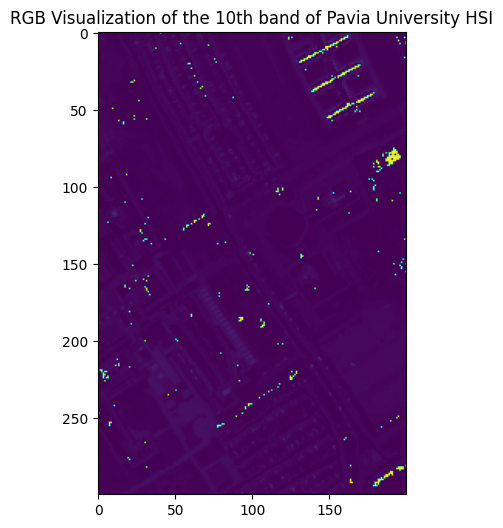

Plotting the abundance map for class/endmember: 3


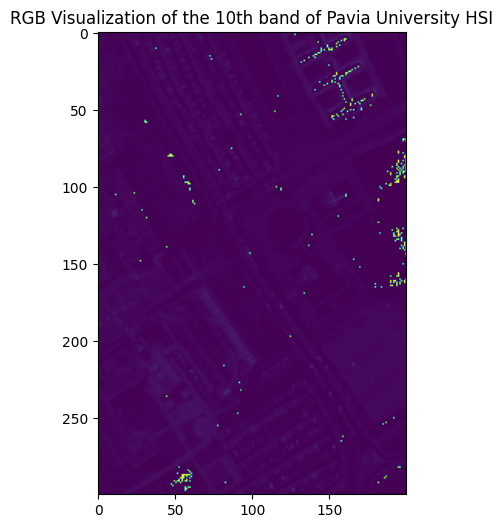

Plotting the abundance map for class/endmember: 4


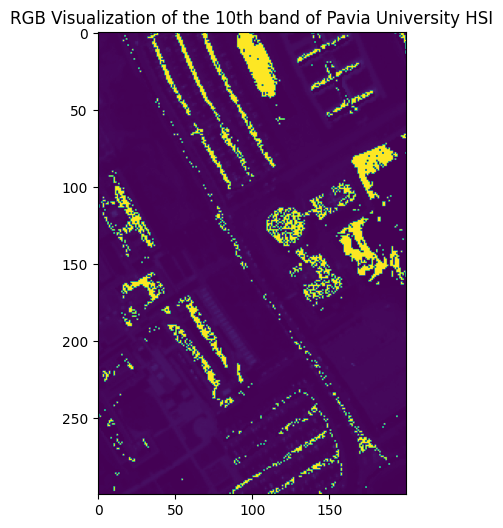

Plotting the abundance map for class/endmember: 5


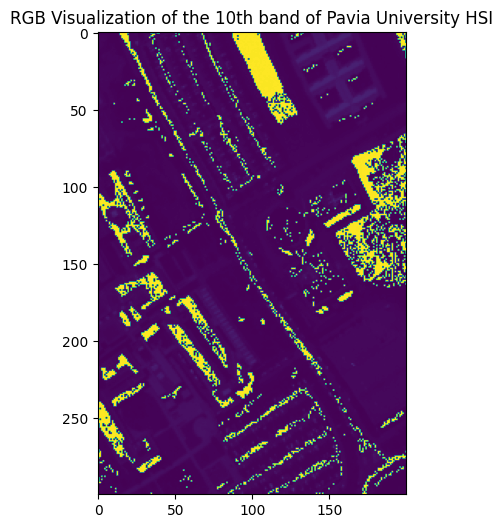

Plotting the abundance map for class/endmember: 6


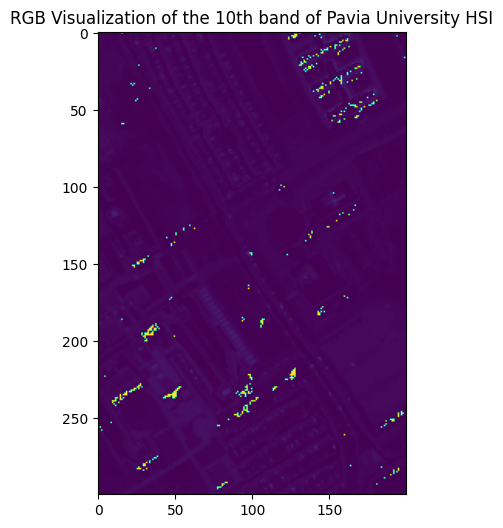

Plotting the abundance map for class/endmember: 7


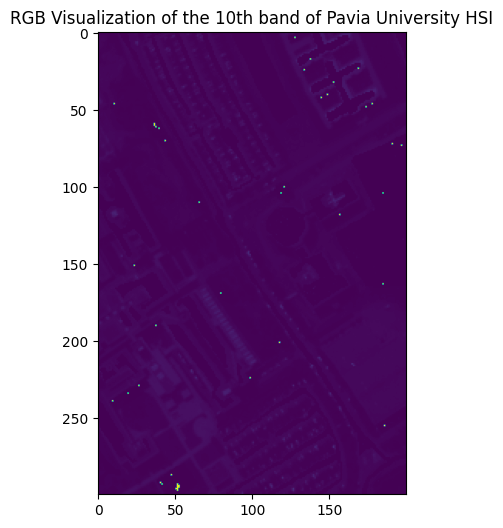

Plotting the abundance map for class/endmember: 8


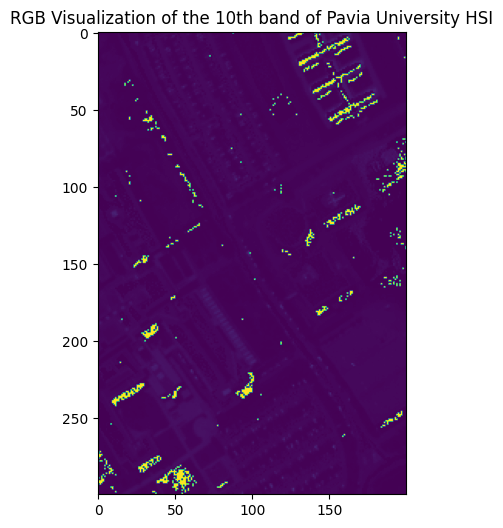

Plotting the abundance map for class/endmember: 9


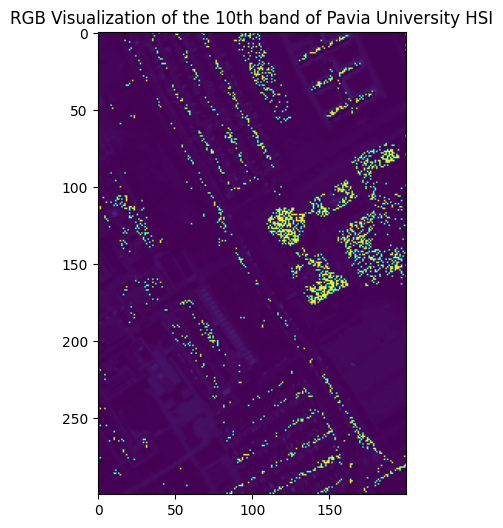

In [45]:
for i in range(9):
    HSI_Lasso = calc_abundance_map(best_theta_lasso, endmembers, HSI, ground_truth, num_of_class=i)
    print(f'Plotting the abundance map for class/endmember: {i+1}')
    image_show(HSI_Lasso, 10)

## Comments on the Results

Taking into consideration the above results we can make the following observations for each method:

- a) Least Squares: Provides a baseline, but may overlook constraints inherent in real-world scenarios like this. So despite the 
fact that the reconstruction error had the smallest value it had mistaken parameters θ. 

- b) Sum-to-One Constraint: Ensures physically meaningful results by adhering to abundance sum constraints, however the parameters where 
not so close to the real ones for the reason that many of them were negative.   

- c) Non-negativity Constraint: Incorporates realism by preventing negative abundance values. It could not achieve the realest results for 
the reason that parameters theta did not sum to one, thus many pixel was consisted of more than 100% of the size of a pixel. However, 
as we can see from the abundance maps the results are quite efficient so the non-negativity constraint can give efficient result for 
this specific problem.    

- d) Combined Constraints: Achieves a balance by considering both sum-to-one and non-negativity constraints. Despite the fact that 
the reconstruction error was almost the worst the abundance maps gave us the best results. We expected these results from this method
for the reason that the constraints were very well suited for this problem.     

- e) LASSO: Introduces sparsity, potentially leading to more interpretable abundance maps. However, regarding the abundance maps we
did not see the best results from these which we expected to.    

## Part 2 - Classification

So, in order to train our non-zero pixels and evaluate their accuracy based on (i) the naïve Bayes classifier, (ii) the Bayesian classifier, (iii) the minimum Euclidean distance classifier and (iv) the k-nearest neighbor classifier we implemented training via k-fold cross validation (k=10) and computed the average accuracy and standard deviation. Finally we trained our classifiers in the whole training set. 
For cases (i) and (iv) we used some ready for use libraries.

For cases (ii) and (iii) which are the Bayes classifier and Minimun Euclidean distance classifier, we created the necessary functions in order to calculate the mean and covariance for each class based on the training set (that is splitted via k-fold cross validation), and estimated the classes of x_test points based on the training. 

So, for all the classifiers we tested them in order to see the accuracy, validation errors, standard deviation and finally the confusion matrix.

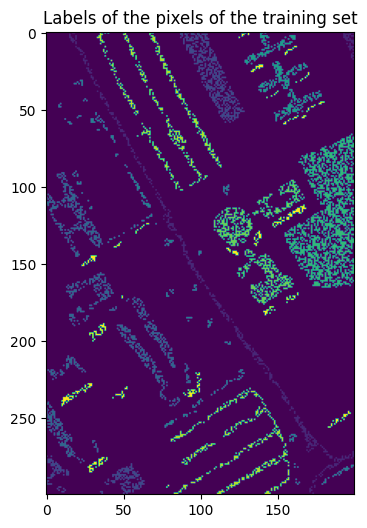

In [83]:
import scipy.io as sio
import numpy as np
from sklearn.metrics import confusion_matrix
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from scipy.stats import multivariate_normal
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
import matplotlib.pyplot as plt

def split_training_set(X, y, Xtest):
    X_train = []
    y_train = []
    X_test = []
    y_test = []
    for i in range(len(y)):
        for j in range(len(y[i])):
            if y[i][j] != 0:
                X_train.append(X[i][j])
                y_train.append(y[i][j])
            elif Xtest[i][j] != 0:
                X_test.append(X[i][j])
                y_test.append(Xtest[i][j])

    return np.array(X_train), np.array(y_train), np.array(X_test), np.array(y_test)

def model_classify(model, model_name, n_splits, X_train, y_train, X_test):
    my_model = model
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

    # Make predictions on the test data
    cv_results = cross_val_score(my_model, X_train, y_train, cv=kf)
    mean = cv_results.mean()
    std = cv_results.std()
    print(f"Mean Validation Error of {model_name} model is: {(1 -mean)*100: .3f}%")
    print(f"Standard Deviation error of {model_name} model is: {std: .3f}")
    print("")
    # Train the classifier on the whole training data
    my_model.fit(X_train, y_train)
    y_pred_all = my_model.predict(X_test)
    return y_pred_all

    # Train the classifier on the whole training data
    my_model.fit(X_train, y_train)
    y_pred_all = my_model.predict(X_test)
    return y_pred_all, y_test


def calc_confusion_matrix (model_name, y_test, y_pred):
    cm = confusion_matrix(y_test, y_pred)
    print(f"The confusion matrix for {model_name} model is: {cm}")
    diagonal_sum = np.sum(np.diagonal(cm))
    sum_cm = np.sum(cm)
    accuracy = diagonal_sum/sum_cm
    print(f"The success rate of {model_name} model is: {accuracy*100: .3f}%")
    print("")
    return accuracy

image_file = 'data/PaviaU_cube.mat'  # Pavia HSI: 300x200x103
endmembers_file = 'data/PaviaU_endmembers.mat'  # Endmember's matrix: 103x9
ground_truth_file = 'data/PaviaU_ground_truth.mat'
HSI = load_data(image_file, 'X')

# Training set for classification
Pavia_labels = sio.loadmat('data/classification_labels_Pavia.mat')
Training_Set = (np.reshape(Pavia_labels['training_set'],(200,300))).T
Test_Set = (np.reshape(Pavia_labels['test_set'],(200,300))).T
Operational_Set = (np.reshape(Pavia_labels['operational_set'],(200,300))).T

# Create the training and test set via the above labels
X_train, y_train, X_test, y_test = split_training_set(HSI, Training_Set, Test_Set)

fig = plt.figure(figsize=(12,6))
plt.imshow(Training_Set)
plt.title('Labels of the pixels of the training set')
plt.show()

## Train each classifier, calculate mean estimated validation error and standard deviation - Plot confusion matrix
### i) Naive Bayes Classifier cases

In [84]:
# Train Naive Bayes model
nb_model = GaussianNB()
nb_preds = model_classify(nb_model, 'Naive Bayes', 10, X_train, y_train, X_test)

# Compute the confusion matrix and success rate for Naive Bayes
nb_accuracy = calc_confusion_matrix('Naive Bayes', y_test, nb_preds)

Mean Validation Error of Naive Bayes model is:  33.983%
Standard Deviation error of Naive Bayes model is:  0.018

The confusion matrix for Naive Bayes model is: [[131   0  37   0   0   0  80  13   0]
 [  0 326   4   6   0  17   0   0   0]
 [ 25   2 127   0   0  13  70 299   0]
 [  0   0   0 154   1   1   0   0   0]
 [  0   0   1   0 166   1   0   0   0]
 [  0 312   2  55  32 363   0   0   0]
 [ 18   0  26   0   0   0 277   0   0]
 [  2   1  67   0   0   1   2 388   0]
 [  0   0   0   2   0   0   0   0 185]]
The success rate of Naive Bayes model is:  66.012%



### Comments on Naive Bayes Confusion Matrix

As we can spot from the confusion matrix we have many classes that are NOT well separated by the classifier. More specifically, for class 3 (Asphalt) 75% of the values are misclassified. Also, for class 6 (Tiles)  more than 50% of the values are misclassified. Moreover, class 1 (Water), and class 8 (Meadows) have many misclassified values. The rest classes are well separated. Overall, as we can see from the success rate we do not have a very efficient classification from Naive Bayes Classifier.

### iv) Bayesian classifier case

So for the Bayesian we did not use any ready for use library. We created two (2) functions (create_mean & create_cov) in order to calculate the means and covariances based on the training dataset. We use k-fold cross validation in order to train each time our classifier and calculate the means and covariances. 
We built functions in order to train and evaluate our model. We must take into consideration that the functions we created can use the minimun Euclidean distance classifier for the reason that this classifier just calculates the ||x - μj|| = minq=1,…M ||x - μ q|| and assigned in the class with the minimun distance. 
Finally, we trained our classifiers based on the whole dataset and predict the classes on the X_test values

In [95]:
def create_mean(set_y, set_x, num_class=9):
    """
    Estimate mean of a multivariate
    Gaussian distribution
    """
    num_dimensions = len(set_x[0])
    mean = np.zeros(num_dimensions)
    num_of_values = 0
    for i in range(len(set_y)):
        if set_y[i] == num_class:
            mean += set_x[i]
            num_of_values += 1

    if num_of_values>0:
        mean = np.array(mean / num_of_values)
        prob_w_class = num_of_values/len(set_y)
        return mean, prob_w_class
    else:
        print('No values assigned in this class')
        return None


def create_cov(y, X, mean, num_class=9):
    """
    Estimate covariance of a multivariate
    Gaussian distribution
    """
    num_dimensions = len(X[0])
    cov = np.zeros((num_dimensions, num_dimensions))
    num_of_values = 0
    for i in range(len(y)):
        if y[i] == num_class:
            cov += np.outer((X[i] - mean), (X[i] - mean))
            num_of_values += 1
    if num_of_values>0:
        cov = cov / num_of_values
        return cov
    else:
        print('No values assigned in this class')
        return None


def estimate_values(X, probs_w, means, covariances):
    """
    Calculate the probability of a new point x via
    the estimated pdf p(x/wj)
    """
    prob_y = []
    pdf_of_classes = []
    for i in range(len(means)):
        my_pdf = multivariate_normal(mean=means[i], cov=covariances[i])
        pdf_of_classes.append(my_pdf)
    for i in range(len(X)):
        max = 0
        best_class = 0
        for j in range(len(pdf_of_classes)):
            if pdf_of_classes[j] is None:
                prob_x = 0
            else:
                prob_x = pdf_of_classes[j].pdf(X[i]) * probs_w[j]
            if prob_x >= max:
                max = prob_x
                best_class = j + 1
        prob_y.append(best_class)

    return prob_y


def calc_min_euclidean(X, means):
    prob_y = []
    for i in range(len(X)):
        min = -1
        best_class = 0
        for j in range(len(means)):
            eucl_dist = np.sqrt(np.sum((X[i] - means[j]) ** 2))
            if min == -1:
                min = eucl_dist
            if eucl_dist < min:
                min = eucl_dist
                best_class = j+1
        prob_y.append(best_class)

    return prob_y


def train_and_evaluate(model_name, X, y, Xtest, k_fold=10 , num_classes=9):
    kf = KFold(n_splits=k_fold, shuffle=True, random_state=42)

    accuracy_scores = []
    for train_index, test_index in kf.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        class_means = []
        class_covariances = []
        class_probs_w = []
        for class_number in range(1, num_classes+1):
            mean, prob_w = create_mean(y_train, X_train, class_number)
            cov = create_cov(y_train, X_train, mean, class_number)
            class_probs_w.append(prob_w)
            class_means.append(mean)
            class_covariances.append(cov)
        if model_name == "Bayes Classifier":
            predictions = estimate_values(X_test, class_probs_w, class_means, class_covariances)
            accuracy = accuracy_score(y_test, predictions)
            accuracy_scores.append(accuracy)
        else:
            predictions = calc_min_euclidean(X_test, class_means)
            accuracy = accuracy_score(y_test, predictions)
            accuracy_scores.append(accuracy)

    avg_accuracy = np.mean(accuracy_scores)
    std = np.std(accuracy_scores)
    print(f"Mean Validation Error of {model_name} model is: {(1-avg_accuracy)*100: .3f}%")
    print(f"Standard Deviation error of Bayes classifier model is: {std: .3f}")
    print("")

    # Train it in the whole training set
    class_means_all = []
    class_covariances_all = []
    class_probs_w_all = []
    for class_number in range(1, num_classes + 1):
        mean, prob_w = create_mean(y, X, class_number)
        cov = create_cov(y, X, mean, class_number)
        class_probs_w_all.append(prob_w)
        class_means_all.append(mean)
        class_covariances_all.append(cov)
    if model_name == "Bayes Classifier":
        y_pred_all = estimate_values(Xtest, class_probs_w_all, class_means_all, class_covariances_all)
    else:
        y_pred_all = calc_min_euclidean(Xtest, class_means_all)

    return y_pred_all


In [96]:
# Train Bayes Classifier model
bayes_preds = train_and_evaluate('Bayes Classifier', X_train, y_train, X_test)
# Compute the confusion matrix and success rate for Bayesian Classifier
bayes_accuracy = calc_confusion_matrix('Bayes Classifier', y_test, bayes_preds)

Mean Validation Error of Bayes Classifier model is:  12.034%
Standard Deviation error of Bayes classifier model is:  0.010

The confusion matrix for Bayes Classifier model is: [[155   0  46   0   0   2  10  48   0]
 [  0 328   0   3   0  22   0   0   0]
 [ 10   1 430   0   0   0   0  95   0]
 [  0   0   0 154   0   2   0   0   0]
 [  0   0   0   0 168   0   0   0   0]
 [  0   1   0   1   0 762   0   0   0]
 [ 14   0  10   0   0   2 291   4   0]
 [ 19   0  73   0   0   2   0 367   0]
 [  3   0   0   1   2   0   0   0 181]]
The success rate of Bayes Classifier model is:  88.432%



### Comments on Bayesian Classifier Confusion Matrix

As we can spot from the confusion matrix we have very few classes that are NOT well separated by the classifier. More specifically, class 1 (Water), class 3 (Asphalt) and class 8 (Meadows) have some misclassified values. The rest classes are very efficiently separated. Overall, as we can see from the success rate we have a very efficient classification from Bayesian Classifier.

### ii) Minimum Euclidean distance Classifier case


In [94]:
# Train minimun Euclidean distance Classifier model
euclidean_preds = train_and_evaluate('minimun Euclidean distance classifier', X_train, y_train, X_test)
# Compute the confusion matrix and success rate for minimun Euclidean distance Classifier
euclidean_accuracy = calc_confusion_matrix('minimun Euclidean distance classifier', y_test, euclidean_preds)

Mean Validation Error of minimun Euclidean distance classifier model is:  49.103%
Standard Deviation error of Bayes classifier model is:  0.022

The confusion matrix for minimun Euclidean distance classifier model is: [[  0   0   0   0   0   0   0   0   0   0]
 [152   0   0  46   0   0   0  61   2   0]
 [  1   0 188   0   5   0 156   0   3   0]
 [ 66   0   2 198   0   0   1  39 230   0]
 [  0   0   0   0 154   0   0   0   0   2]
 [  0   0   0   0   0 128   0   0  40   0]
 [ 11   0 317   0  12  16 240   0 168   0]
 [ 61   0   0  23   0   0   0 237   0   0]
 [  2   0   1 145   0   0   1   7 305   0]
 [  0   0   0   0   0   0   0   0   0 187]]
The success rate of minimun Euclidean distance classifier model is:  51.045%



### Comments on Minimum Euclidean distance Confusion Matrix

As we can spot from the confusion matrix we have many classes that are NOT well separated by the classifier. More specifically, for classes 1(Water), 2 (Trees), 3 (Asphalt) and class 6(Tiles) 75% of the values are misclassified. Also, for classes 5 (Tiles), 7(Shadows) and 8 (Meadows) we  have many misclassified values. The rest classes are relatively well separated. Overall, as we can see from the success rate we do not have a very efficient classification from Minimum Euclidean distance Classifier.


### iv) k-Nearest Neighbor Classifier case


In [65]:
# Train k-Nearest Neighbor model
knn_model = KNeighborsClassifier()
knn_preds = model_classify(knn_model, 'k-nearest neighbor', 10,  X_train, y_train, X_test)

# Compute the confusion matrix and success rate for k-nearest neighbor
knn_accuracy = calc_confusion_matrix('k-nearest neighbor', y_test, knn_preds)

Mean Validation Error of k-nearest neighbor model is:  12.003%
Standard Deviation error of k-nearest neighbor model is:  0.014

The confusion matrix for k-nearest neighbor model is: [[195   0  15   0   0   0  24  27   0]
 [  0 322   0   0   0  31   0   0   0]
 [ 10   1 448   0   0   4   1  72   0]
 [  0   0   0 155   0   1   0   0   0]
 [  0   0   1   0 166   0   0   1   0]
 [  0  56   2   0   1 704   0   1   0]
 [ 12   0   5   0   0   0 303   1   0]
 [  9   2  85   0   0   0   2 363   0]
 [  0   0   0   0   0   0   0   0 187]]
The success rate of k-nearest neighbor model is:  88.650%



### Comments on  k-nearest neighbor Confusion Matrix

As we can spot from the confusion matrix we have very few classes that are NOT well separated by the classifier. More specifically, class 1 (Water), class 3 (Asphalt), class 6 (Tiles) and class 8 (Meadows) have some misclassified values. The rest classes are very efficiently separated. Overall, as we can see from the success rate we have a very efficient classification from k-nearest neighbor Classifier.

## Part 3 - Comment on the combination of the results of parts I & II

As we can see from the results both the unmixing and classification methods we can spot a correlation between them. If we take our best classifiers (k-nn and Bayes classifier)with our best unmixing methods (LS with non-negative constraint and LS with non-negative & sum-to-one constraints) regarding the abundance map we can observe that many of the non-zero class pixels contain a high  percentage of a pure pixel. If we check the confusion matrix we can observe that many non-zero class pixels will be assigned to the correct class, thus these pixels contain a high rate of a pure pixel. We can can verify the above clarification by checking the abundance maps of our best unmixing methods, in which we see that the result of these abundance maps are very close to the real ones. 

On the other hand, for classifiers whose accuracy were not very efficient and for unmixing methods in which the abundance maps where not very clear, we can observe that there is no strong correlation that verifies any good estimation or clarification. 